## Loading the libraries

In [1]:
import pandas as pd
import numpy as np
import statistics

# plotting modules
%matplotlib inline
import plotly.graph_objects as go
import plotly.express as px

# set seed for reproducibility
np.random.seed(0)

In [2]:
pd.options.display.max_columns = 100
pd.options.display.width = 1000

## Reading the data

In [3]:
# read the data
df = pd.read_csv('AB_NYC_2019.csv')

# and check how it looks like
df.sample(5)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
43813,33893655,Studio in doorman building in Tribeca,138798990,Jonas,Manhattan,Tribeca,40.72430,-74.01110,Entire home/apt,225,3,0,NaN,NaN,1,42
32734,25798461,Large 2 bedroom downtown Loft Apartment,195803,Zinnia,Manhattan,NoHo,40.72555,-73.99283,Entire home/apt,649,1,5,2018-11-03,0.40,1,75
25276,20213045,Spacious and Modern 2 Bed/2.5 Bath Dream Townh...,2678122,Tasha,Brooklyn,Williamsburg,40.71687,-73.95012,Entire home/apt,300,5,5,2019-06-12,0.35,3,31
36084,28670432,X 20-203,115993835,Shimin,Brooklyn,Sunset Park,40.64036,-74.00822,Private room,26,1,13,2019-04-12,1.36,5,141
17736,13920697,Brownstone apt in Bklyn w/ gorgeous natural light,29513490,Whitney,Brooklyn,Bedford-Stuyvesant,40.68370,-73.93325,Entire home/apt,125,2,4,2017-01-02,0.12,1,0


In [4]:
# check the type of every column in the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

## Handling missing values

In [5]:
# how many nulls do we get here?
missing_data = df.isnull().sum()
missing_data

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [6]:
# missing data in total
missing_data_in_total = missing_data.sum()
data_in_total = np.prod(df.shape)

(missing_data_in_total/data_in_total) * 100

2.574521934758155

In [7]:
# drop the columns
df.drop(['host_name'], axis=1, inplace=True) #host name is not needed, if something we'll use host id;
df.drop(['last_review'], axis=1, inplace=True) #this value is not needed in our case

In [8]:
# replace some null values
df.fillna({'reviews_per_month':0}, inplace=True) #if there were no comments (null value) we can put 0 there
df.fillna({'name':'no_name_here'}, inplace=True) #we just replace this null value to no_name_here instead of dropping those records because it may give us some more information

In [9]:
# how many nulls do we get here now?
missing_data = df.isnull().sum()
missing_data

id                                0
name                              0
host_id                           0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

## Exploring and Visualizing Data

In [10]:
df.head(5)

,id,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,0.00,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0


### Hosts with the biggest number of listings

In [11]:
# top 5 hosts
hosts_id_biggest_number_of_listings = list(map(lambda host_id: str(host_id), df.value_counts('host_id').head(5).keys().tolist()))
number_of_listings = df.value_counts('host_id').head(5).tolist()

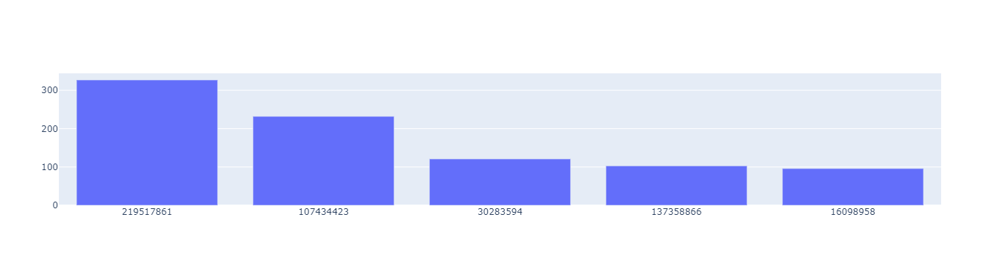

In [12]:
fig1 = go.Figure([go.Bar(x=hosts_id_biggest_number_of_listings, y=number_of_listings)])
fig1.show()

In [13]:
# all the hosts
hosts_id_biggest_number_of_listings_all = list(map(lambda host_id: str(host_id), df.value_counts('host_id').keys().tolist()))
number_of_listings_all = df.value_counts('host_id').tolist()

In [14]:
# how many listings per host?
print('The mean is equal to:', statistics.mean(number_of_listings_all))

The mean is equal to: 1.3053634834610353


In [15]:
# and median
print('The median is equal to:', statistics.median(number_of_listings_all))

The median is equal to: 1


### The distribution of neighbourhoods

In [16]:
# Grouping and perform count over each group
df['count'] = 1
df_by_neighbourhood =  df.groupby(['neighbourhood','neighbourhood_group'], as_index=False)[['count']].count()
df_by_neighbourhood.sort_values(by='count', inplace=True)

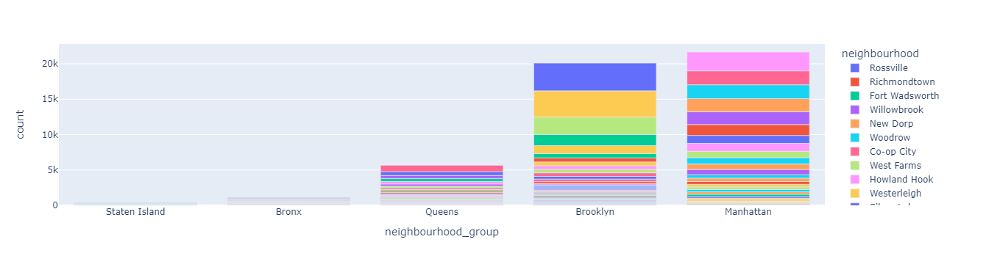

In [17]:
fig2 = px.bar(df_by_neighbourhood, x="neighbourhood_group", y="count", color="neighbourhood")
fig2.show()

As we can see the biggest part of all the listings are located in Brooklyn and Manhattan. The most popular neighbourhoods are Williamsburg, Bedford-Stuyvesant and Harlem.

### Price vs localization

How it looks on the map?

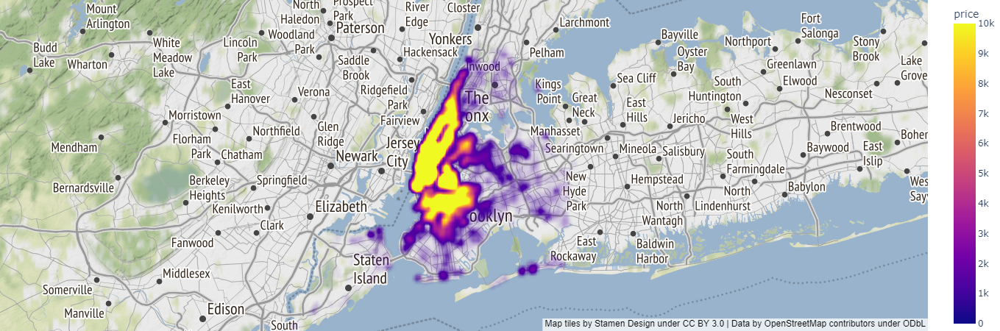

In [18]:
fig3 = px.density_mapbox(df
                         ,lat='latitude'
                         ,lon='longitude'
                         ,z='price'
                         ,radius=9
                         ,center=dict(lat=40.737, lon=-73.923)
                         ,zoom=9
                         ,mapbox_style="stamen-terrain"
                         ,hover_name='name' 
                         ,height=450
                         ,width=1000)
fig3.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig3.show()

### Some price statistics

Let's take a glimpse on the distribution of price

In [19]:
# Selecting prices below 450 to cut outliers and to get cleaner plot
df_violin = df[df['price'] < 450]

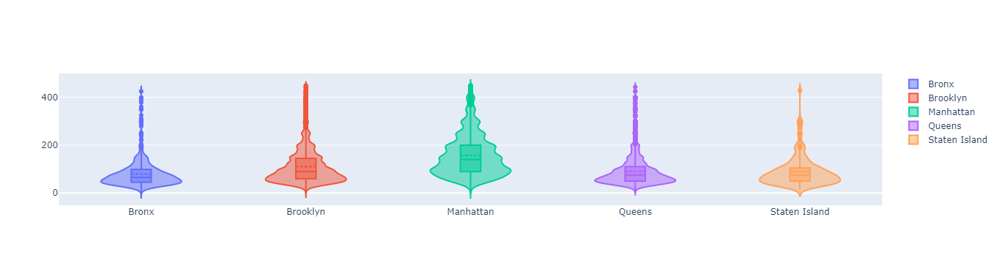

In [20]:
fig4 = go.Figure()

neighbourhoods = ['Bronx', 'Brooklyn', 'Manhattan', 'Queens', 'Staten Island']

for neighbourhood in neighbourhoods:
    fig4.add_trace(go.Violin(x=df_violin['neighbourhood_group'][df['neighbourhood_group'] == neighbourhood],
                            y=df_violin['price'][df['neighbourhood_group'] == neighbourhood],
                            name=neighbourhood,
                            box_visible=True,
                            meanline_visible=True))

fig4.show()

In [21]:
# Grouping and getting some statistics over the price per neighbourhood_group
df_by_price =  df.groupby(['neighbourhood_group'], as_index=False)[['price']].describe()
columns = df.groupby(['neighbourhood_group'], as_index=False)[['price']].count()['neighbourhood_group']

In [22]:
df_by_price['neighbourhood_group'] = columns
df_by_price

price                                                            neighbourhood_group
     count        mean         std   min   25%    50%    75%      max                    
0   1091.0   87.496792  106.709349   0.0  45.0   65.0   99.0   2500.0               Bronx
1  20104.0  124.383207  186.873538   0.0  60.0   90.0  150.0  10000.0            Brooklyn
2  21661.0  196.875814  291.383183   0.0  95.0  150.0  220.0  10000.0           Manhattan
3   5666.0   99.517649  167.102155  10.0  50.0   75.0  110.0  10000.0              Queens
4    373.0  114.812332  277.620403  13.0  50.0   75.0  110.0   5000.0       Staten Island

### Type of apartment

In [23]:
# Grouping and perform count over each type of apartment
df_by_room_type =  df.groupby(['neighbourhood_group','room_type'], as_index=False)['availability_365'].count()

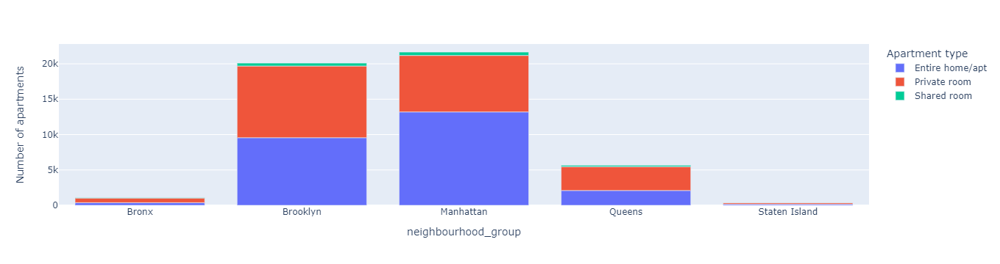

In [24]:
# Types of the apartments per neighbourhood
fig5 = px.bar(df_by_room_type, 
              x="neighbourhood_group", 
              y="availability_365", 
              color="room_type",
              labels={
                  "availability_365": "Number of apartments",
                  "room_type": 'Apartment type'
                  })
fig5.show()

In [25]:
df['room_type'].value_counts().keys().to_list()
df['room_type'].value_counts().to_list()

[25409, 22326, 1160]

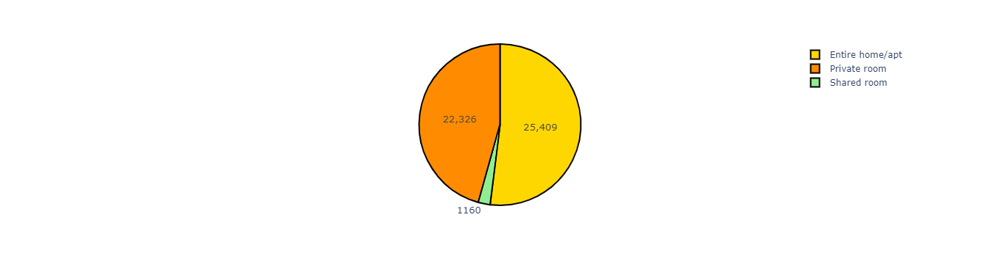

In [26]:
# Types of the apartments all together
colors = ['gold', 'darkorange', 'lightgreen']

fig = px.pie(df, 
             values=df['room_type'].value_counts().to_list(), 
             names=df['room_type'].value_counts().keys().to_list()
            )
fig.update_traces(textinfo='value', textfont_size=13,
                  marker=dict(colors=colors, line=dict(color='#000000', width=2)))

fig.show()

## Scale and Normalize Data

# and check how it looks like one more time
df.sample(5)